In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
imag_path="/content/drive/MyDrive/train"

In [4]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

In [5]:
import os
import glob

In [78]:
str("/content/drive/MyDrive/test/joined_6000.jpg")


'/content/drive/MyDrive/test/joined_6000.jpg'

In [79]:
sample_image = tf.io.read_file(str("/content/drive/MyDrive/test/joined_6000.jpg"))
sample_image = tf.io.decode_jpeg(sample_image)
print(sample_image.shape)

(256, 512, 3)


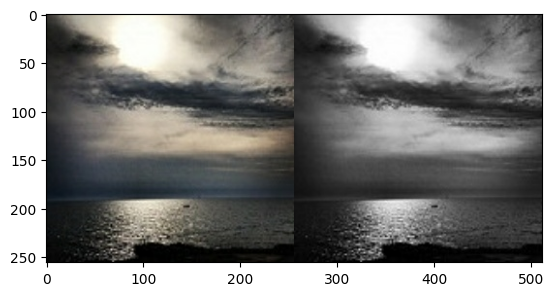

In [80]:
plt.figure()
plt.imshow(sample_image)

In [81]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [82]:
def load2_x (image_file):
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

In [83]:
path_image= str("/content/drive/MyDrive/test/joined_6000.jpg")

In [177]:
 #tf.io.read_file(str("/content/drive/MyDrive/test/joined_6000.jpg"))

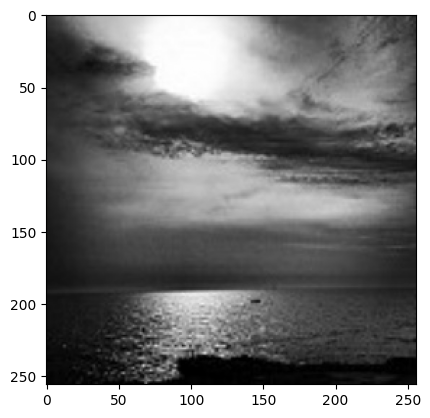

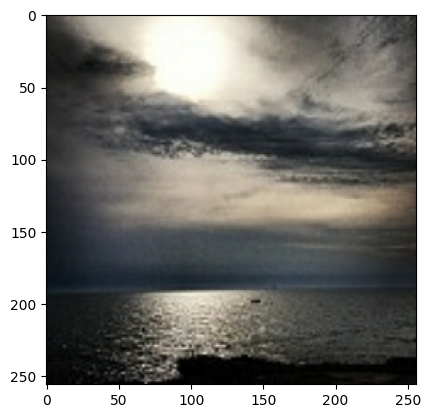

In [127]:
inp, re = load(path_image)
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)

In [85]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [96]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [97]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [98]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [99]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

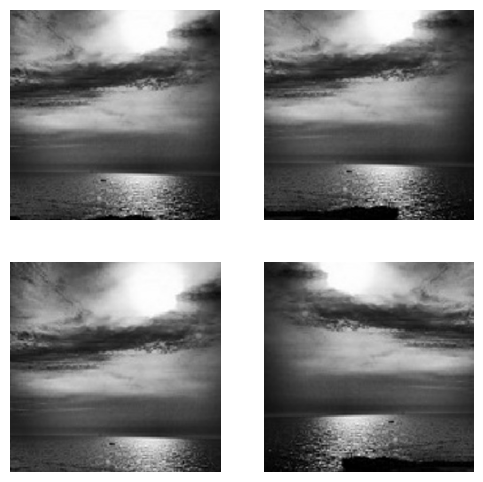

In [100]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [101]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [102]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [103]:
PATH="/content/drive/MyDrive/"

In [113]:
train_dataset = tf.data.Dataset.list_files(str(PATH + 'train/*.jpg'))
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [105]:
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH + 'test/*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH + 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [106]:
OUTPUT_CHANNELS =3

In [107]:
def downsample(filters, size, apply_batchnorm=True):

  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(tf.keras.layers.Conv2D(filters,size, strides=2,\
                                    padding='same', kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())
  return result





In [108]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [109]:
def upsample(filters, size, apply_dropout =False):
  initializer = tf.random_normal_initializer(0., 0.02)
  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2DTranspose(
          filters,size,strides=2,\
          padding='same',
          kernel_initializer=initializer,
          use_bias=False
      )
  )

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
    result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [110]:
up_model =upsample(3,4)
up_result = up_model(down_result)
print(up_result.shape)

(1, 256, 256, 3)


In [111]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256,256,3])

  down_stack =[
      downsample(64,4, apply_batchnorm=False),
      downsample(128,4),
      downsample(256,4),
      downsample(512,4),
      downsample(512,4),
      downsample(512,4),
      downsample(512,4),
      downsample(512,4),
  ]

  up_stack =[
      upsample(512,4,apply_dropout=True),
      upsample(512,4,apply_dropout=True),
      upsample(512,4,apply_dropout=True),
      upsample(512,4),
      upsample(256,4),
      upsample(128,4),
      upsample(64,4),
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose( OUTPUT_CHANNELS,4,strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')
  
  x= inputs
  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

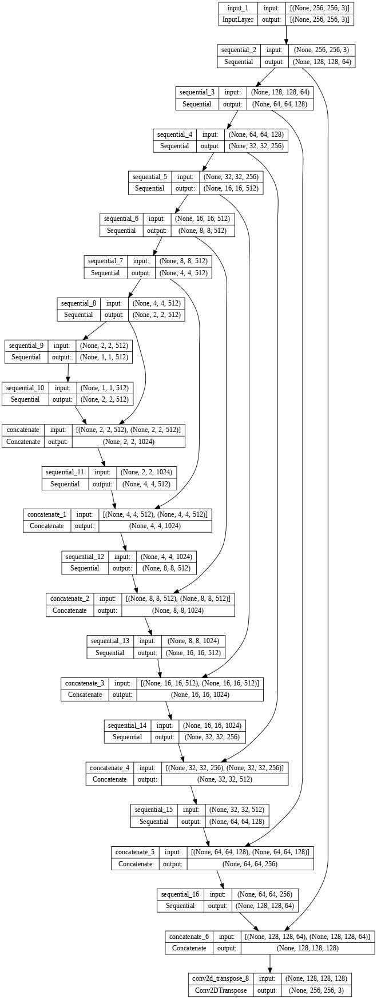

In [34]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

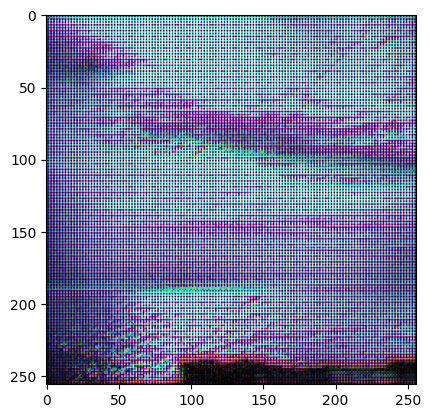

In [35]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
plt.imshow(gen_output[0, ...])

In [36]:
LAMBDA = 100

In [37]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [38]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [39]:
#Discriminator

In [40]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

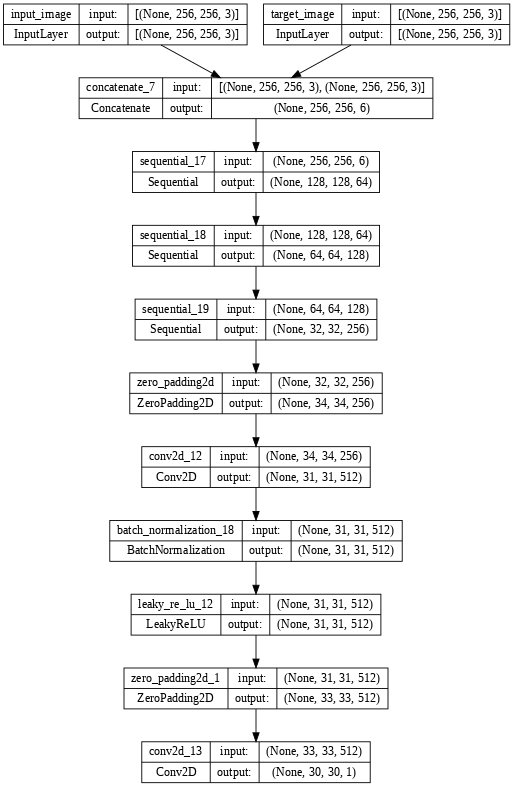

In [41]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

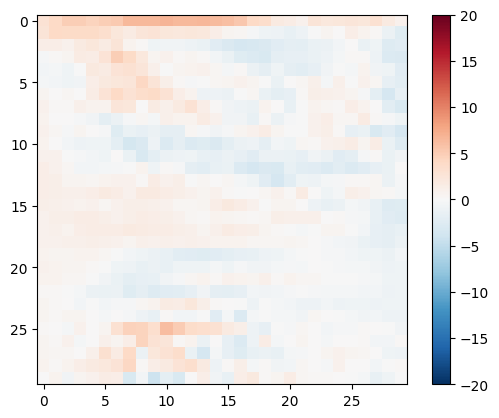

In [42]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], vmin=-20, vmax=20, cmap='RdBu_r')
plt.colorbar()

In [43]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [44]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [45]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [46]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

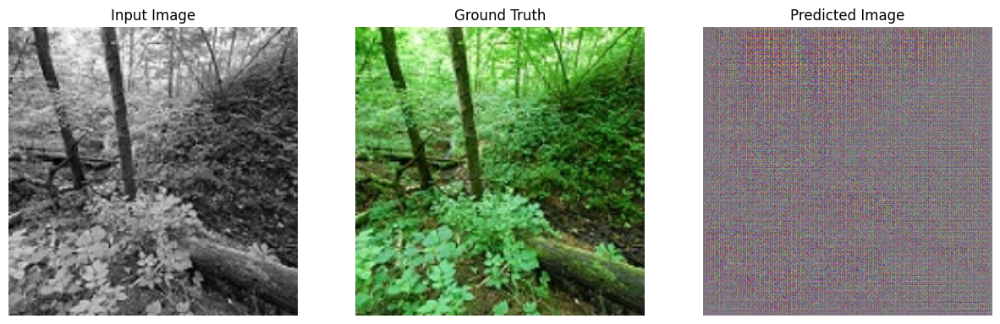

In [47]:
for example_input, example_target in test_dataset.take(1):
  generate_images(generator, example_input, example_target)

In [48]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [49]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)
    # gives out fake images

    disc_real_output = discriminator([input_image, target], training=True)
    #disc REAL verdict on real image and real image

    disc_generated_output = discriminator([input_image, gen_output], training=True)
    #disc FAKE verdict on  real image and GEN FAKE IMAGE

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    #GEn has Total loss = Gen Loss + MSE LOSS

    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)
    #DIS LOSS = Real image loss , Fake image loss

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [50]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Time taken for 1000 steps: 93.58 sec



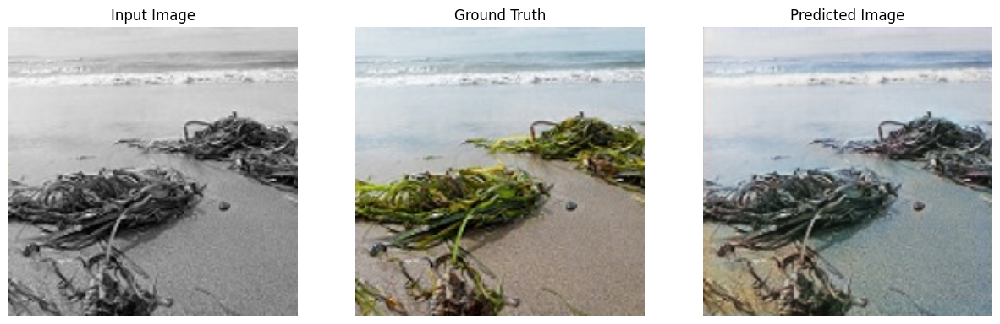

Step: 39k
....................................................................................................

In [51]:
fit(train_dataset, test_dataset, steps=40000)

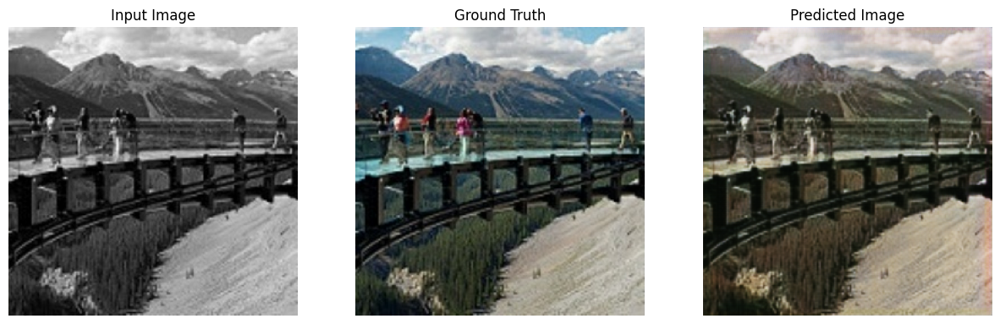

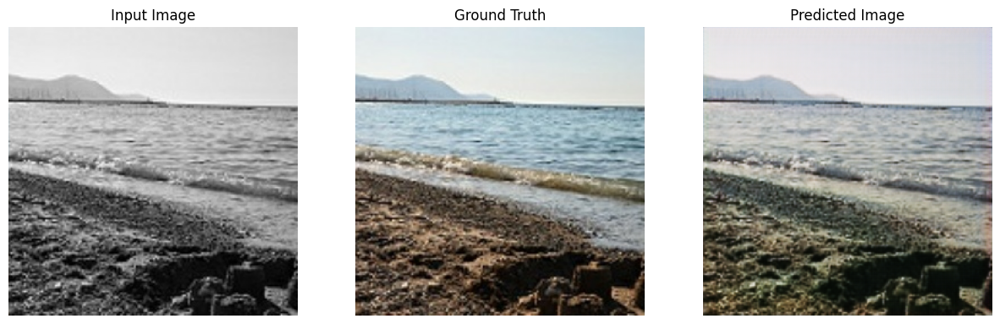

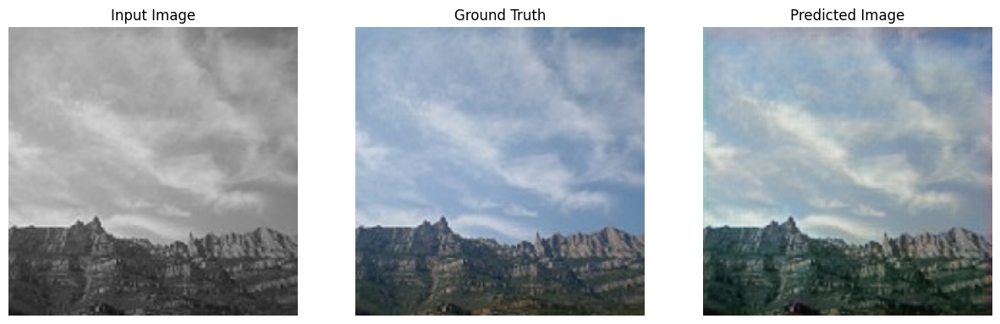

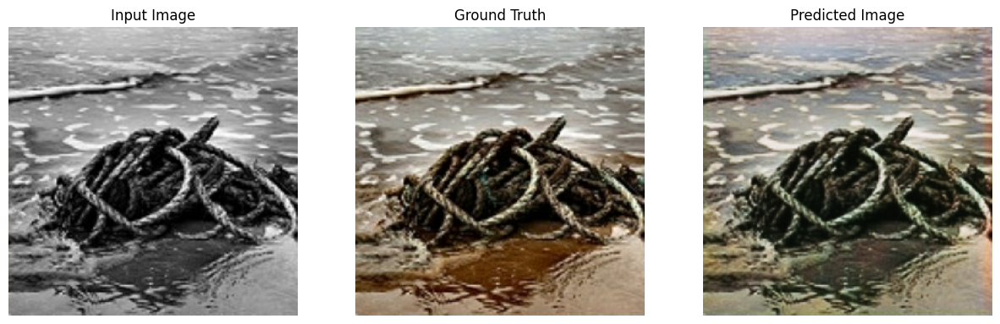

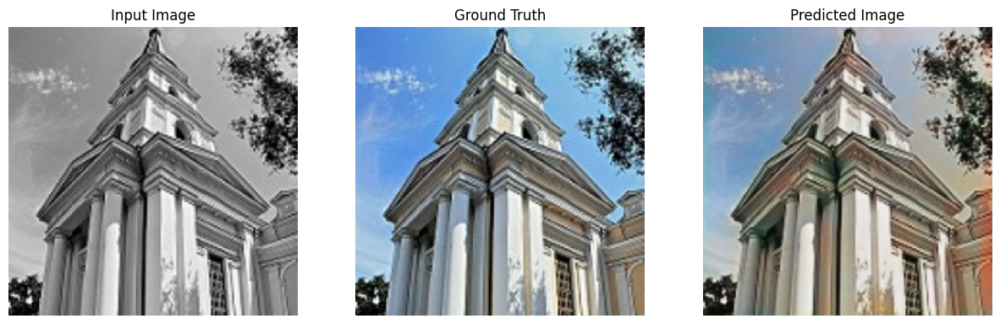

In [52]:
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [194]:
#?generator.predict

In [ ]:
#Preprocess Prediction Images

In [53]:
path_image= str('/content/drive/MyDrive/test1.jpeg')

In [54]:
def load2(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)
  image = tf.image.resize(image, [256,256])

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  #w = tf.shape(image)[1]
  #w = w // 2
  #input_image = image[:, w:, :]
  #real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(image, tf.float32)
  #real_image = tf.cast(real_image, tf.float32)

  return input_image

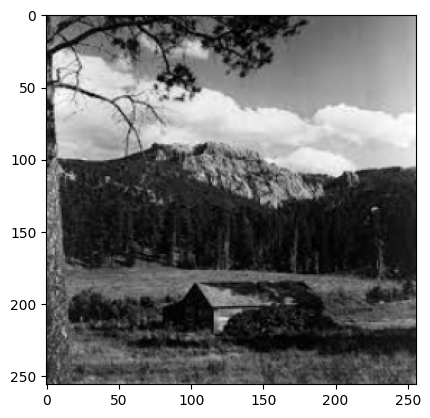

In [55]:
inp2= load2(path_image)
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp2 / 255.0)


In [56]:
def load_p(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image 
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, w:, :]
  real_image = image[:, :w, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

In [57]:
def resize_p(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [58]:
# Normalizing the images to [-1, 1]
def normalize_p(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1
  return input_image, real_image

In [59]:
def load_image_train_p(image_file):
  input_image, real_image = load_p(image_file)
  input_image, real_image = resize_p(input_image, real_image,256,256)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [68]:
PATH

'/content/drive/MyDrive/'

In [124]:
prediction_dataset = tf.data.Dataset.list_files(str(PATH + 'prediction/*.jpg'))
prediction_dataset= prediction_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)

In [125]:
prediction_dataset.take(1)

<_TakeDataset element_spec=(TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(256, 256, 3), dtype=tf.float32, name=None))>

(256, 256, 3)
(256, 256, 3)


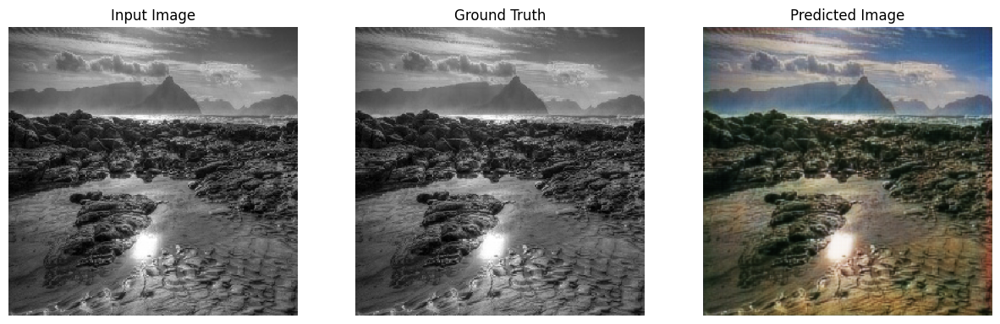

(256, 256, 3)
(256, 256, 3)


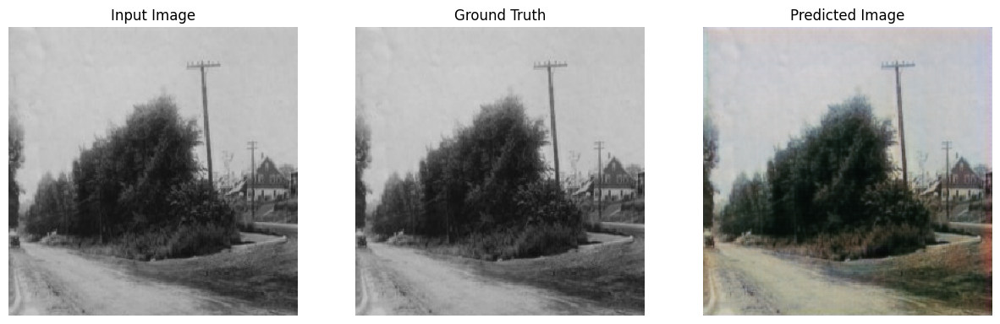

(256, 256, 3)
(256, 256, 3)


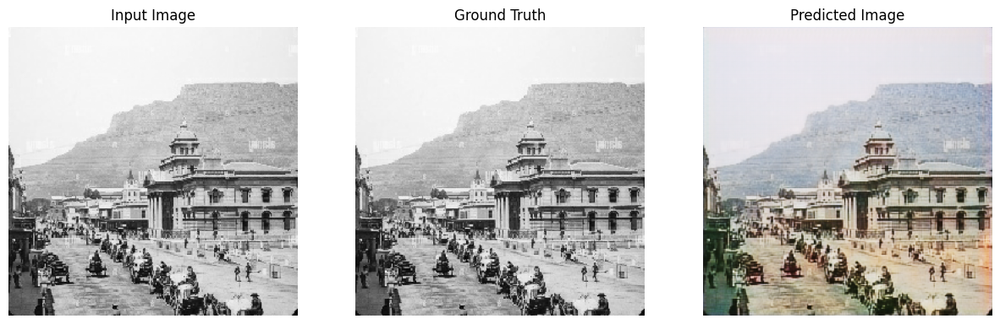

(256, 256, 3)
(256, 256, 3)


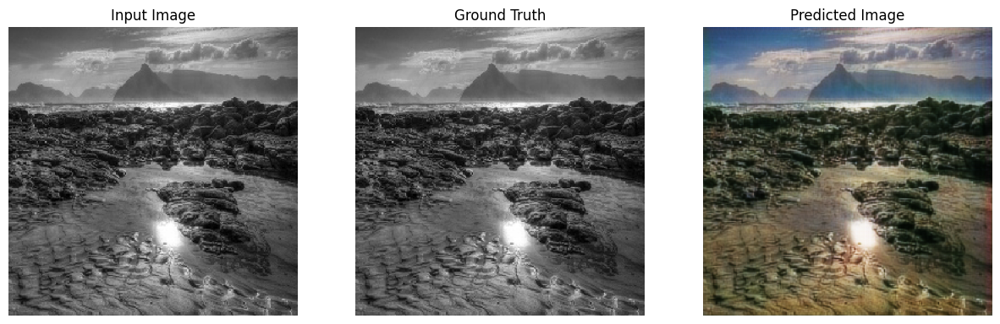

(256, 256, 3)
(256, 256, 3)


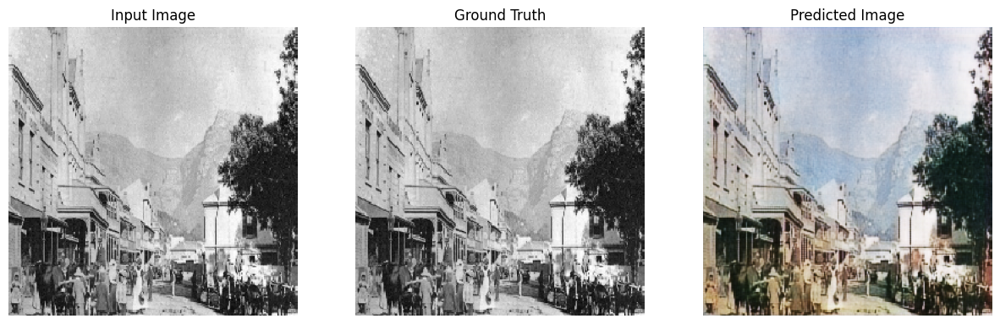

(256, 256, 3)
(256, 256, 3)


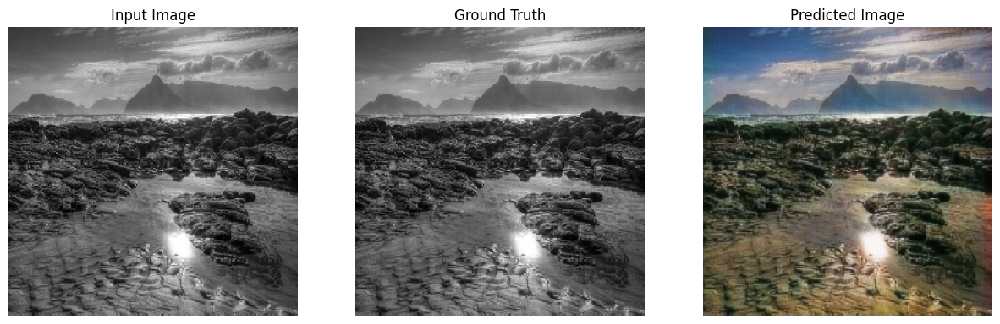

(256, 256, 3)
(256, 256, 3)


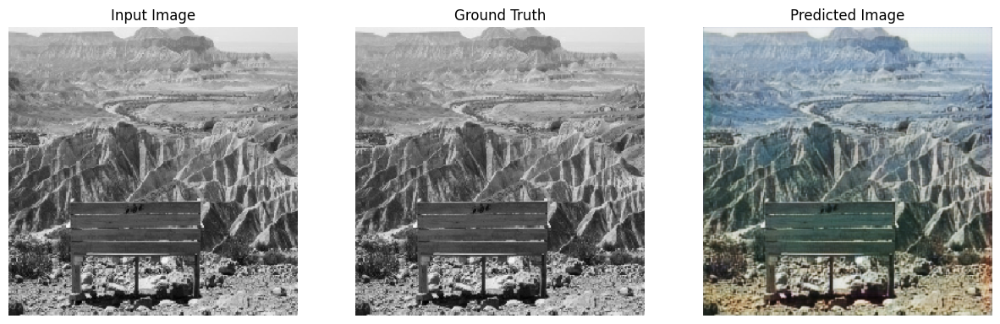

(256, 256, 3)
(256, 256, 3)


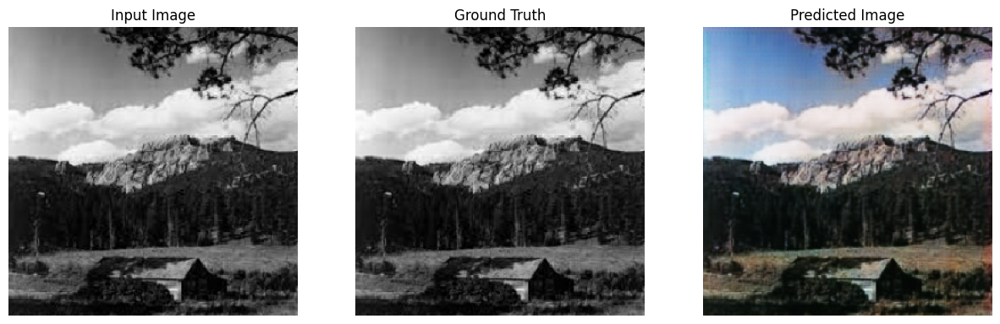

(256, 256, 3)
(256, 256, 3)


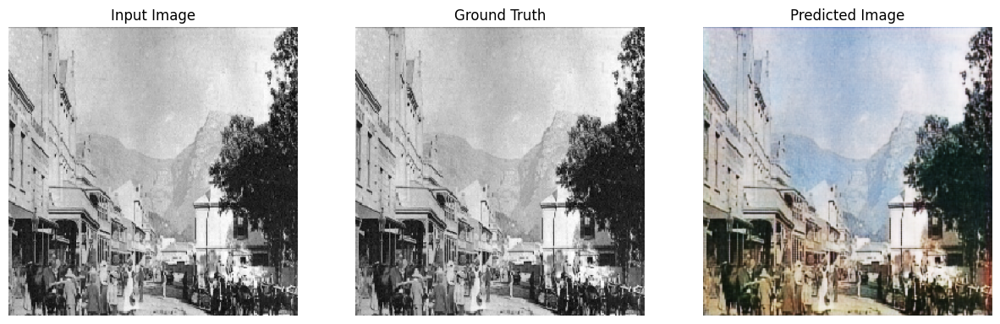

In [135]:
for inp, tar in prediction_dataset.take(10):
  print(inp.shape)
  print(tar.shape)
  inp1= tf.reshape(inp,[1,256, 256, 3])
  generate_images(generator, inp1, inp1)

In [139]:
from tensorflow.keras.models import save_model
from tensorflow.keras.models import load_model

In [137]:
save_model(generator, "generator_landscape.h5")

In [140]:
model_loaded = load_model('generator_landscape.h5')

(256, 256, 3)
(256, 256, 3)


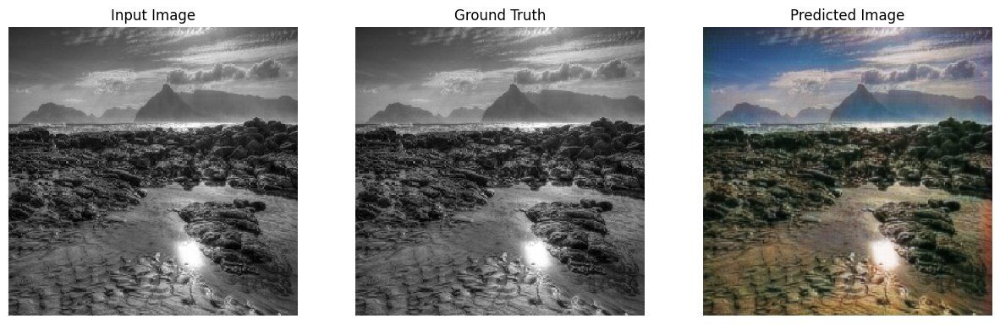

(256, 256, 3)
(256, 256, 3)


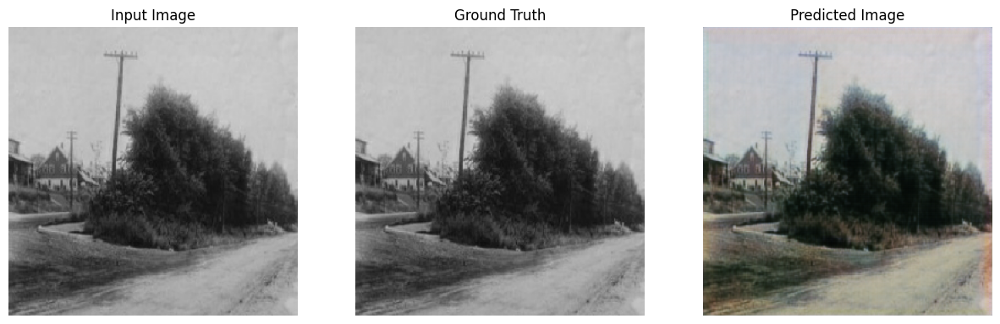

(256, 256, 3)
(256, 256, 3)


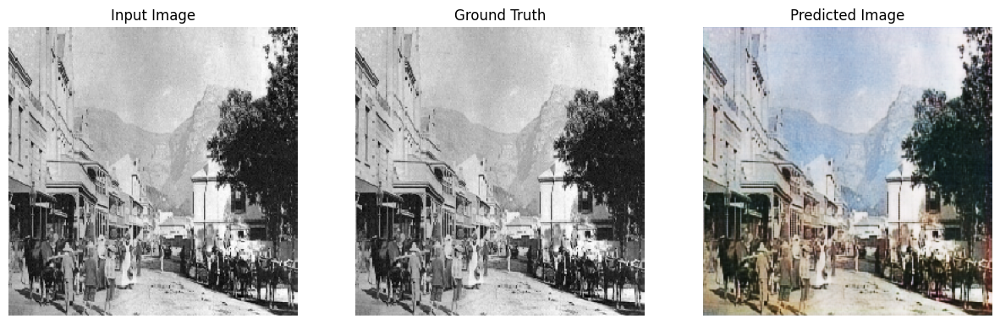

(256, 256, 3)
(256, 256, 3)


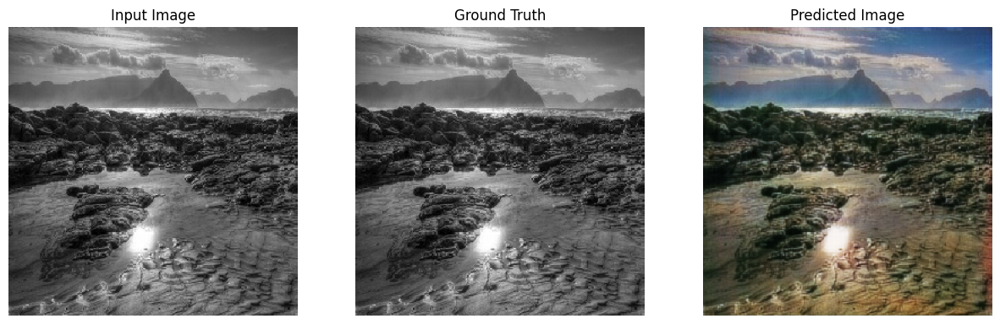

(256, 256, 3)
(256, 256, 3)


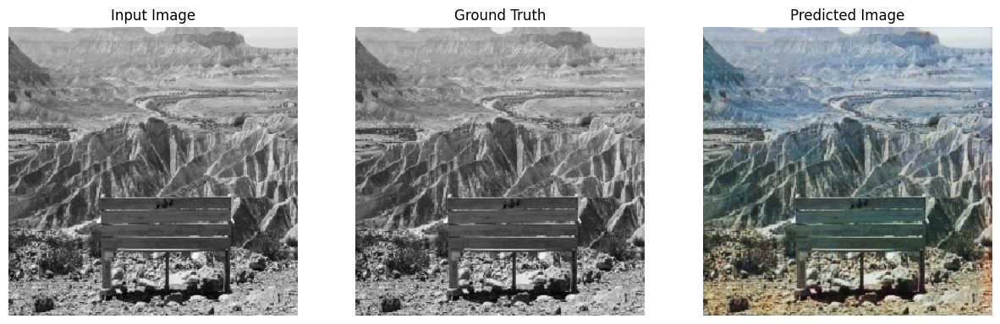

(256, 256, 3)
(256, 256, 3)


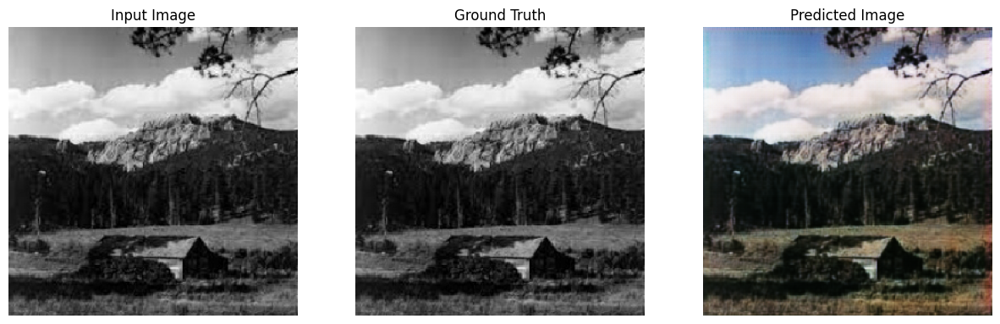

(256, 256, 3)
(256, 256, 3)


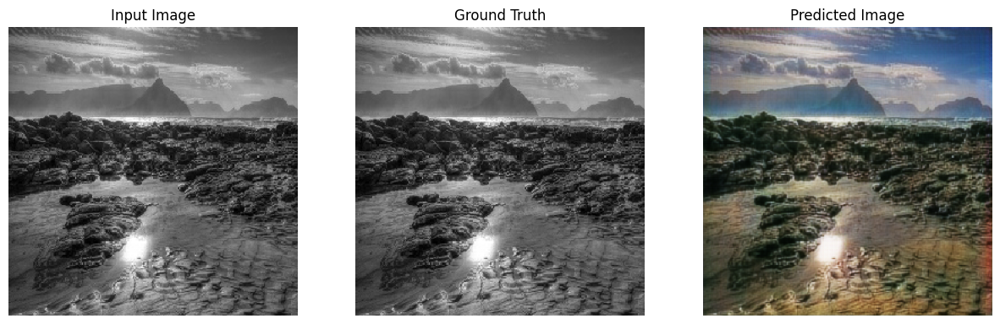

(256, 256, 3)
(256, 256, 3)


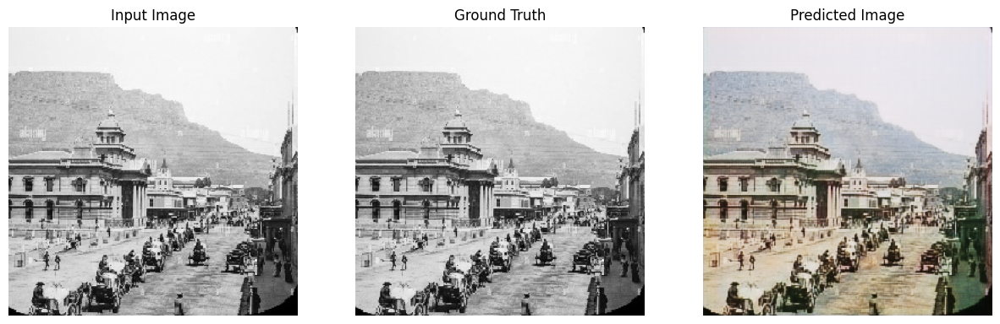

(256, 256, 3)
(256, 256, 3)


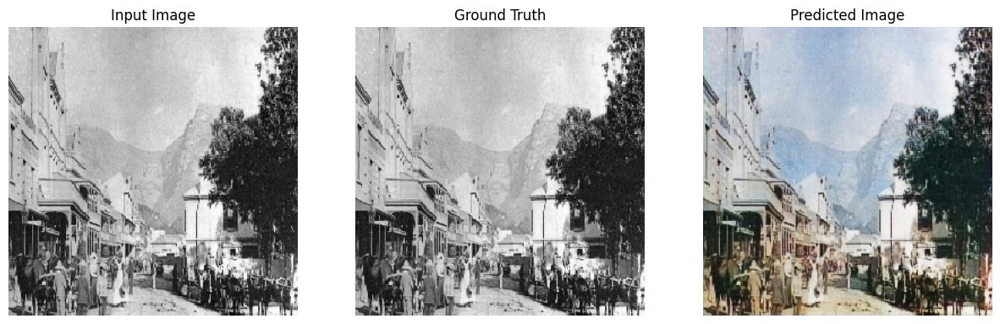

In [141]:
for inp, tar in prediction_dataset.take(10):
  print(inp.shape)
  print(tar.shape)
  inp1= tf.reshape(inp,[1,256, 256, 3])
  generate_images(model_loaded, inp1, inp1)